In [5]:
#This should be the complete set of data needed to graph the orbits
import orekit
vm = orekit.initVM()
from org.orekit.data import DataProvidersManager, ZipJarCrawler
from org.orekit.frames import FramesFactory
from org.orekit.bodies import OneAxisEllipsoid
from org.orekit.time import TimeScalesFactory, AbsoluteDate
from org.orekit.orbits import KeplerianOrbit, PositionAngle
from org.orekit.utils import Constants, IERSConventions
from org.orekit.propagation.analytical import EcksteinHechlerPropagator

from orekit.pyhelpers import setup_orekit_curdir

from math import radians
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import xarray as xr
from netCDF4 import Dataset
import hvplot.xarray
import hvplot.pandas
# from mpl_toolkits.basemap import Basemap

import cartopy.crs as ccrs

setup_orekit_curdir()

## Some Constants, needed for keplerian orbit later
ae = Constants.WGS84_EARTH_EQUATORIAL_RADIUS
mu = Constants.WGS84_EARTH_MU
utc = TimeScalesFactory.getUTC()

## Osculating orbit
#Initial orbit parameters, needed for keplerian orbit later
ra = 800 * 1000         # Apogee
rp = 700 * 1000         # Perigee
i = radians(98.55)      # Inclination
omega = radians(90.0)   # Perigee argument
raan = radians(5.1917)  # Right ascension of ascending node
lv = radians(359.93)    # True anomaly

epochDate = AbsoluteDate(2012, 1, 26, 16, 0, 00.000, utc)

a = (rp + ra + 2 * ae) / 2.0    
e = 1.0 - (rp + ae) / a

## Inertial frame where the satellite is defined
inertialFrame = FramesFactory.getEME2000()

## Orbit construction as Keplerian
#used for t and p variables after use in eck_prop
initialkeplerOrbit = KeplerianOrbit(a, e, i, omega, raan, lv,
                              PositionAngle.TRUE,
                              inertialFrame, epochDate, mu)

## Set up Propagator for reference orbit, used in pv
eck_prop = EcksteinHechlerPropagator(initialkeplerOrbit,
                                    Constants.WGS84_EARTH_EQUATORIAL_RADIUS,
                                    Constants.WGS84_EARTH_MU,
                                    Constants.WGS84_EARTH_C20,
                                    0.0,
                                    0.0,
                                    0.0,
                                    0.0)

startDate = AbsoluteDate(2012, 1, 26, 11, 0, 00.000, utc)

# Overall duration in seconds for extrapolation
duration = 24 * 60 * 60
step_time = 10

# Time array in orekit AbsoluteDate format
t = [startDate.shiftedBy(float(dt)) \
        for dt in np.arange(0, duration, step_time)]

#used in subpoint when zipped with t
pv = [eck_prop.propagate(tt).getPVCoordinates() for tt in t]
p = [tpv.getPosition() for tpv in pv]

ITRF = FramesFactory.getITRF(IERSConventions.IERS_2010, True)
earth = OneAxisEllipsoid(Constants.WGS84_EARTH_EQUATORIAL_RADIUS, 
                         Constants.WGS84_EARTH_FLATTENING, 
                         ITRF)
#used for lat and lon        
subpoint = [earth.transform(tp, inertialFrame, tt)  for tt, tp in zip(t,p)]

lat = np.degrees([gp.getLatitude()  for gp in subpoint])
lon = np.degrees([gp.getLongitude() for gp in subpoint])

df  = pd.DataFrame(lat,lon)
print(pv)

83732906, -7386.286995007481), A(7.774693263727092, 0.8210461981720344, -0.050912217444874786)}>, <TimeStampedPVCoordinates: {2012-01-27T10:46:20.000, P(-7107139.801049762, -739414.7134274638, -27334.41071713967), V(-151.2812892835813, 1099.2728547426289, -7386.390967247157), A(7.77464681315013, 0.8088411874800244, 0.03011056063827039)}>, <TimeStampedPVCoordinates: {2012-01-27T10:46:30.000, P(-7108263.893105074, -728381.7472728072, -101195.46506175464), V(-73.53862949255559, 1107.2998968058748, -7385.684943132833), A(7.7737422024625635, 0.7965535819121197, 0.11108553813312887)}>, <TimeStampedPVCoordinates: {2012-01-27T10:46:40.000, P(-7108610.6180828, -717269.126435962, -175045.4113266593), V(4.190697708214429, 1115.203655974293, -7384.169446084096), A(7.771980477893141, 0.7841848545883239, 0.192003636634115)}>, <TimeStampedPVCoordinates: {2012-01-27T10:46:50.000, P(-7108180.152145831, -706078.0877773595, -248876.1577772342), V(81.89812683240126, 1122.9833284234298, -7381.84509017249),

In [90]:
#these values are NOT to sclae yet, they might be but need to be checked that long and lat are right
maxlat = np.max(lat)
xval = (lon/4)+45
yval = (lat/2)+45
print(maxlat)

81.50852447802535


In [81]:
# graph for the netCDF file 

ds = xr.open_dataset('gsm.20130316_010000.nc')
ds  # Will show you what variables and shape they are in the file

data1 = Dataset('gsm.20130316_010000.nc')
data1.variables.keys()

height  = ds.wam_height_levels.isel(x03 = 1)
density = ds.iss_mass_density
# height.hvplot.quadmesh(x="x01",y="x02")
# height.hvplot()

In [82]:
h_val = np.array(height)
dens  = np.array(density)

In [141]:
maxs = dens[15,15]
maxy = np.min(dens)
maxy

nan

In [83]:
df.hvplot.scatter(color='orange',size=10)
height.hvplot.quadmesh(x="x01",y="x02")



:QuadMesh   [x01,x02]   (wam_height_levels)

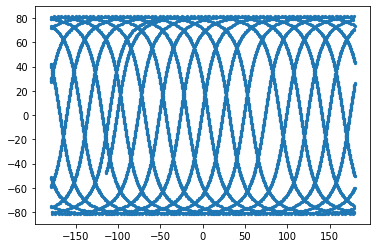

In [84]:
plt.scatter(lon,lat,s=5)

<ipython-input-85-59e358f0a915>:2: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  ax.pcolormesh(height['x01'], height['x02'], h_val)


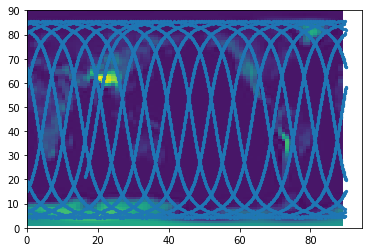

In [85]:
Fig, ax = plt.subplots()
ax.pcolormesh(height['x01'], height['x02'], h_val)
ax.scatter(xval,yval,s=5)


<ipython-input-86-55ee4499adac>:2: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  ax.pcolormesh(density['x01'], density['x02'], dens)


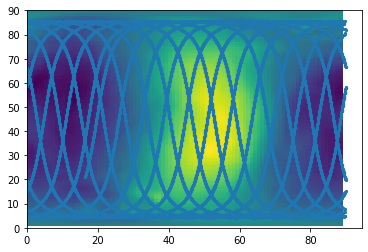

In [86]:
Fig, ax = plt.subplots()
ax.pcolormesh(density['x01'], density['x02'], dens)
ax.scatter(xval,yval,s=5)

In [112]:
bond1 = density['x01']*4-90
bond2 = density['x02']*2-90
maxbond = np.max(bond1)


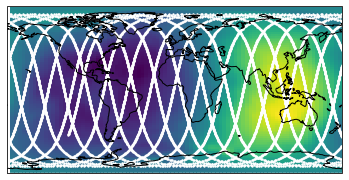

In [117]:
import cartopy.crs as ccrs
fig, ax = plt.subplots(subplot_kw={'projection': ccrs.PlateCarree()})
ax.coastlines()
# Then what you've been doing already
ax.pcolormesh(bond1, bond2, dens)
ax.scatter(lon,lat,s=2,color = 'white')

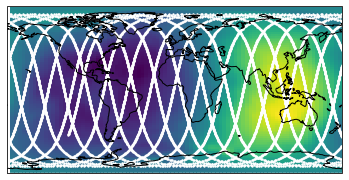

<Figure size 432x432 with 0 Axes>

In [131]:
import cartopy.crs as ccrs
import image
fig, ax = plt.subplots(subplot_kw={'projection': ccrs.PlateCarree()})
ax.coastlines()
# Then what you've been doing already
ax.pcolormesh(bond1, bond2, dens)
ax.scatter(lon,lat,s=2,color = 'white')
plt.figure(figsize=(6,6))
plt.savefig('density_plot.jpg')

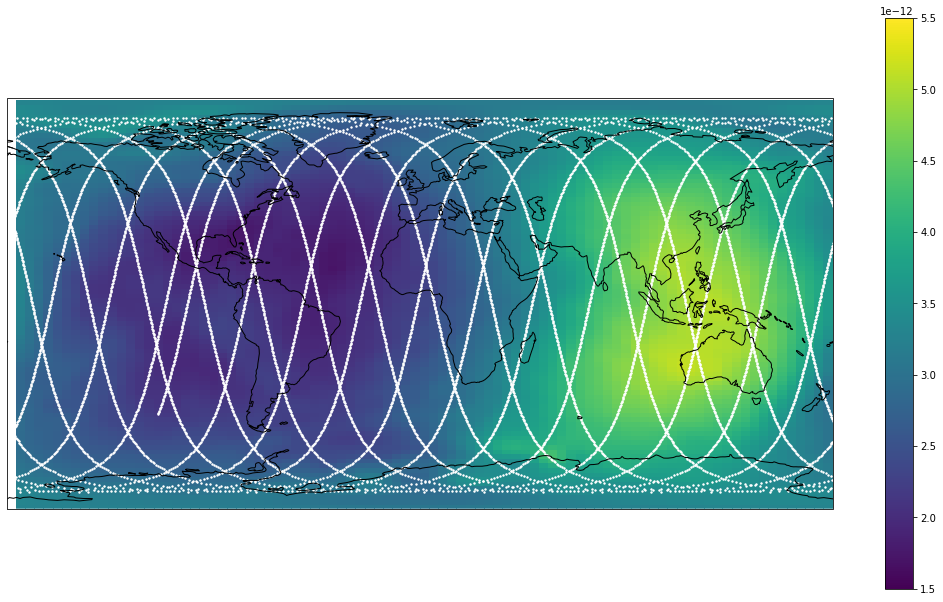

In [144]:
import cartopy.crs as ccrs
import image
from matplotlib.pyplot import figure

#this puts the map over everything
fig, ax = plt.subplots(subplot_kw={'projection': ccrs.PlateCarree()})
ax.coastlines()
#this adds the colormesh and the scatterplot to the existing plot
c = ax.pcolormesh(bond1, bond2, dens, vmin = 1.5e-12,vmax = 5.5e-12)
ax.scatter(lon,lat,s=2,color = 'white')
plt.colorbar(c)
fig.set_size_inches(18.5, 10.5)
#saves the picture as a jpg
fig.savefig('density_plot.jpg', dpi=100)